In [1]:
from fastdownload import FastDownload
d = FastDownload()
path = d.get('https://www2.ips.biba.uni-bremen.de/~jat/fad/dataset.zip')

In [2]:
#!pip install torchsummary
from torchsummary import summary

In [3]:
#!pip install --upgrade opencv-contrib-python;

In [4]:
img_files = path.ls(file_exts='.png').sorted()
print(img_files[0])

/home/BIBA/fad/.fastdownload/data/dataset/cam_1_frame_10_Z_31.png


# Same frame (e.g. 10) from 3 cameras

Original image shape (h, w, c) is:  (480, 640, 3)


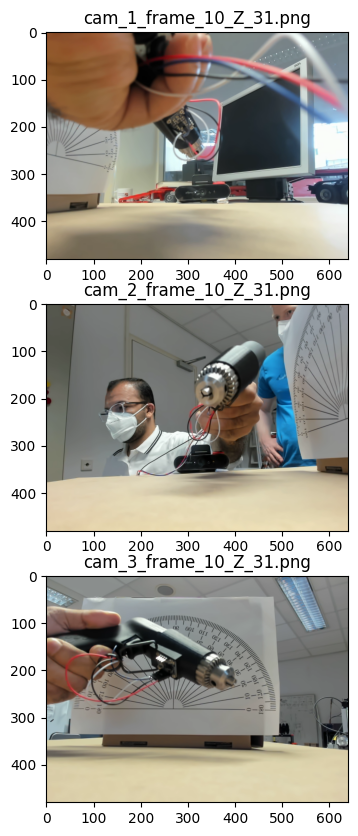

In [5]:
from PIL import Image
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
# Inspect the dataset
fig = plt.figure(figsize=(10,10))
im = cv2.imread(str(img_files[0]))

print('Original image shape (h, w, c) is: ', im.shape)
for i in range(0,3):
    plt.subplot(3, 1, i+1)
    j = int(i*len(img_files)/3)
    img_idx = img_files[j]
    im =cv2.imread(str(img_idx))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.imshow(im)
    plt.title(img_idx.name)
plt.show()

In [6]:
#! pip install albumentations==0.4.6

In [7]:
import re
def simple_get_z(file_name):
    '''return only Z as float from the file_name'''
    z_reg = re.compile(r'Z_(-?\d+).png$')
    return float(z_reg.search(str(file_name)).group(1))

simple_get_z(img_files[3]),img_files[3]

(77.0,
 Path('/home/BIBA/fad/.fastdownload/data/dataset/cam_1_frame_13_Z_77.png'))

# Create Dataset Class

In [87]:
# creation of dataset class
import os
import numpy as np
import torch
from torch.utils.data import Dataset
from torchvision.io import read_image
from torchvision import transforms
import PIL
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


class DrillImages(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None, train_transform = None):
        regexp = re.compile(r'frame_(\d+)_')
        self.frames = list(set([int(regexp.search(str(item)).group(1)) for item in os.listdir(img_dir)]))
        self.file_names = os.listdir(img_dir)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        self.train_transform = train_transform

    def __len__(self):
        return len(self.frames) # number of distinct frames

        def __getitem__(self, idx):
        frame_number = self.frames[idx]
        file_names = [item for item in self.file_names if 'frame_'+str(frame_number)+'_' in(item)]

        for i,f in enumerate(file_names):
        # read image file
        img_path = os.path.join(self.img_dir, f)  
        image = cv2.imread(img_path)

        # border_mode: 4 By default
        # border_mode: 0: BORDER_CONSTANT, 1: BORDER_REPLICATE, 2 : BORDER_REFLECT, 3: BORDER_WRAP , 4: BORDER_REFLECT_101

        transform = A.Compose([
          A.PadIfNeeded(min_height=640, min_width=640, border_mode=1, value=[0, 0, 0], p=1),
          A.RandomBrightnessContrast(p=0.1),
          A.HorizontalFlip(p=0.1),
          A.MotionBlur(p=0.1),
          A.OpticalDistortion(p=0.1),
          A.GaussNoise(p=0.1),
          A.GridDropout(p=0.1),
          A.GaussNoise(var_limit=350.0, p=1.0),
          A.ChannelShuffle(p=0.1),
          A.Resize(224, 224)
          ])

        image = transform(image=image)["image"]

        # convert image to grayscle
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # >>print(type(drill_dataset[0][0]))  > torch.Size([3, 640, 640]) instead of torch.Size([9, 640, 640])


        convert_tensor = transforms.ToTensor()
        #convert_tensor = ToTensorV2()    # with Albumentations library

        t = convert_tensor(image)
        if i == 0:
        t1 = t
        else:
        t1 = torch.cat([t1, t], dim=0)

        z_reg = re.compile(r'Z_(-?\d+).png$')
        angle = float(z_reg.search(str(file_names[0])).group(1))
        
        if self.transform is not None:
            image = self.transform(image = image)['image']
        if self.target_transform is not None:
            angle = self.target_transform(angle)
        return t1,angle  

In [88]:
# create our dataset instance:
drill_dataset = DrillImages(path)

# Length, First Tensor, Second Tensor

In [89]:
len(drill_dataset)

58

In [90]:
# Validate dataset tuple
print(drill_dataset[0][0].shape)
print(drill_dataset[0][1])

torch.Size([3, 224, 224])
77.0


In [91]:
drill_dataset[0][0][0:3].shape

torch.Size([3, 224, 224])

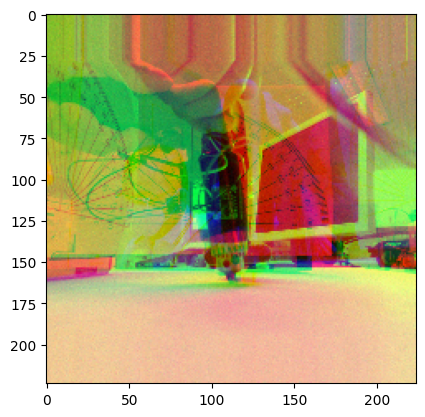

In [92]:
tensor_image = drill_dataset[0][0][0:3]
plt.imshow(tensor_image.permute(1, 2, 0))

In [93]:
print(type(drill_dataset[0][0][0][0][0].item()))

<class 'float'>


In [94]:
print(type(drill_dataset[0][0][0][0][0].item()))

<class 'float'>


## Model Creation

You can use timm if you realy want

pytorch has that also build in

In [95]:
from torch import nn 
from torchvision.models import resnet50
res_torch = resnet50()
res_torch;

so both models are nearly the same, but both cant handle our tensors yet

In [96]:
# Pytorch nn.Conv2d layer expects inputs of (batch_size, channels, height, width)

random_input = torch.rand([1,3,224, 224])

random_input.shape,res_torch(random_input).shape # second returns output shape of resnet

(torch.Size([1, 3, 224, 224]), torch.Size([1, 1000]))

But our tensors are not shaped that way:

In [97]:
drill_dataset[0][0].shape

torch.Size([3, 224, 224])

the loaded models both work on batches, so we convert our data accordingly to a batch of size 1

In [98]:
example_data = drill_dataset[0][0]
print(example_data.shape)

example_data= drill_dataset[0][0].unsqueeze(0)
print(example_data.shape)

torch.Size([3, 224, 224])
torch.Size([1, 3, 224, 224])


In [102]:
# When we had: torch.Size([9, 224, 224]), 
# we need a layer that converts to the resnet input size:


#preprocessing_layer = nn.Conv2d(3, 3, stride = 1, kernel_size=3) # O = [(W−K+2P)/S]+1, padding = 0 , I = 224, O = ((224-3+2*0)/2) +1 = 222
#print(preprocessing_layer(example_data).shape)

using it with the resnet:

In [104]:
#res_torch(preprocessing_layer(example_data)).shape

res_torch(example_data).shape

torch.Size([1, 1000])

finaly we need the layer to convert to a single value

In [109]:
final_layer = nn.Linear(1000,1)
shape = final_layer(res_torch(example_data)).shape

print('final layer output shape', shape)
print(final_layer(res_torch(example_data)))

final layer output shape torch.Size([1, 1])
tensor([[0.2488]], grad_fn=<AddmmBackward0>)


In [110]:
final_layer(res_torch(example_data))

tensor([[0.2488]], grad_fn=<AddmmBackward0>)

# Configurations

In [111]:
DEVICE = 'cuda'

BATCH_SIZE = 1    # When batch size is changed to 2, and error occurs. "PyTorch autograd -- grad can be implicitly created only for scalar outputs"
IMG_SIZE = 224

LR = 0.001
EPOCHS = 10

# Model Class (nn.Nodule) Implementation

In [112]:
from torch import nn 
from torchvision.models import resnet50
res_torch = resnet50()
res_torch;

In [113]:
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.conv = nn.Conv2d(3, 3, stride = 1, kernel_size=3) # O = [(W−K+2P)/S]+1, padding = 0 , I = 224, O = ((224-3+2*0)/2) +1 = 222
        self.res_torch = resnet50()
        self.final = nn.Linear(1000,1)   

    def forward(self, x, angles = None): # why do I need angles=None here? bug1 # try nn.seq to 
        x = self.conv(x)
        print('Output shape of the first convolution:   ', x.shape)
        x = self.res_torch(x)
        print('Output shape of the resnet:              ', x.shape)
        #x = self.final(x) # this executed two times
        #print('Output shape of the final linear layer:  ', x.shape, '\n')
        return self.final(x)

model = MyModel()

# Remove comments to migrate the model and dataset to the GPU:

In [66]:
model.to(DEVICE);
#example_data.to(DEVICE);

In [67]:
#model(example_data)

#output = model(example_data)

# Shouldn't the output of the first conv layer be of shape [1, 3, 224, 224]? I think this is the input the resent34 would accpet? how is it working with 222,222?

# Here is the model summary: 

In [69]:
summary(model, (3, 224, 224));

Output shape of the first convolution:    torch.Size([2, 3, 222, 222])
Output shape of the resnet:               torch.Size([2, 1000])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 3, 222, 222]              84
            Conv2d-2         [-1, 64, 111, 111]           9,408
       BatchNorm2d-3         [-1, 64, 111, 111]             128
              ReLU-4         [-1, 64, 111, 111]               0
         MaxPool2d-5           [-1, 64, 56, 56]               0
            Conv2d-6           [-1, 64, 56, 56]          36,864
       BatchNorm2d-7           [-1, 64, 56, 56]             128
              ReLU-8           [-1, 64, 56, 56]               0
            Conv2d-9           [-1, 64, 56, 56]          36,864
      BatchNorm2d-10           [-1, 64, 56, 56]             128
             ReLU-11           [-1, 64, 56, 56]               0
       BasicBlock-12           [

# Create dataloaders:

In [114]:
from tqdm.notebook import tqdm    # progress bar

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [115]:
train_ds, valid_ds = train_test_split(drill_dataset, test_size = 0.2, random_state=42) # remove randam state in production to get a truely random split.

In [116]:
BATCH_SIZE = 1

trainloader = torch.utils.data.DataLoader(train_ds, batch_size = BATCH_SIZE, shuffle = True)
validloader = torch.utils.data.DataLoader(valid_ds, batch_size = BATCH_SIZE, shuffle = False)

In [117]:
print("Total no. batches in trainloader : {}".format(len(trainloader)))
print("Total no. batches in validloader : {}".format(len(validloader)))

for tensor, angle in trainloader:
    break;
print("Shape of one tensor batch : {}".format(tensor.shape))
print("Shape of one angle batch  : {}".format(angle.shape))

Total no. batches in trainloader : 46
Total no. batches in validloader : 12
Shape of one tensor batch : torch.Size([1, 3, 224, 224])
Shape of one angle batch  : torch.Size([1])


# Train and Evaluation Functions (+ MSE Loss Function):

In [74]:
def train_fn(model, dataloader, optimizer, loss_fn = nn.MSELoss()):
    total_loss = 0.0
    model.train() # Sets mode, dropout layers are activated. Does not call the forward function.

    for data in tqdm(dataloader):
    # bug2
    t, angles = data
    t, angles = t.to(DEVICE), angles.to(DEVICE)

    # _ ,loss = model(t, angles)
    output = model(t)
    loss = loss_fn(output.float(), angles.float()) # solves the got double but expected float error.

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()


    total_loss += loss.item()
    
    return total_loss / len(dataloader)

In [75]:
def eval_fn(model, dataloader, loss_fn = nn.MSELoss()):
    total_loss = 0.0
    model.eval() # Dropout OFF

    with torch.no_grad():
        for data in tqdm(dataloader):

            t, angles = data
            t, angles = t.to(DEVICE), angles.to(DEVICE)

            output = model(t)
            loss = loss_fn(output, angles)

            total_loss += loss.item()

            return total_loss / len(dataloader)


# Optimizer

In [76]:
optimizer = torch.optim.Adam(model.parameters(), lr=4e-4) # have you moved the model to the gpu? if no, the model won't be optimized

In [77]:
import numpy as np
import sys
#sys.path.append('/content/')

In [78]:
train_loss = train_fn(model, trainloader, optimizer)

  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


/home/BIBA/fad/anaconda3/envs/qualifyar_rpi/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


# K-folds Division:

In [79]:
from sklearn.model_selection import KFold
from torch.utils.data import Dataset, DataLoader,TensorDataset,random_split,SubsetRandomSampler, ConcatDataset
import random

In [80]:
k=5
splits=KFold(n_splits=k,shuffle=True,random_state=42) # delete random state in production to get truely random splits.
foldperf={}

In [81]:
# create our dataset instance:
drill_dataset = DrillImages(path)

# Training Loop for K-folds

In [83]:
EPOCHS = 2 

In [84]:
for fold, (train_idx,val_idx) in enumerate(splits.split(np.arange(len(drill_dataset)))):

    print('Fold {}'.format(fold + 1))
    print('\n')
    train_sampler = SubsetRandomSampler(train_idx)
    valid_sampler = SubsetRandomSampler(val_idx)
    train_loader = DataLoader(drill_dataset, batch_size=BATCH_SIZE, sampler=train_sampler)
    valid_loader = DataLoader(drill_dataset, batch_size=BATCH_SIZE, sampler=valid_sampler)
    
    #device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    #model = ConvNet()
    #model.to(device)
    #optimizer = optim.Adam(model.parameters(), lr=0.002)

    #history = {'train_loss': [], 'valid_loss': [],'train_acc':[],'valid_acc':[]}
    history = {'train_loss': [], 'valid_loss': []}

    best_valid_loss = np.Inf
    for i in range(EPOCHS):
        train_loss = train_fn(model, trainloader, optimizer)
        valid_loss = eval_fn(model, validloader)
        print(type(valid_loss))

        if valid_loss < best_valid_loss:
        torch.save(model.state_dict(), 'best_model.pt')
        print("Weights are saved")
        best_valid_loss = valid_loss

        print(f"Epoch : {i + 1} train loss : {train_loss}, valid loss : {valid_loss}")

        history['train_loss'].append(train_loss)
        history['valid_loss'].append(valid_loss)
        #history['train_acc'].append(train_acc)
        #history['valid_acc'].append(valid_acc)

    foldperf['fold{}'.format(fold+1)] = history  

torch.save(model,'k_cross_CNN.pt')


Fold 1




  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 1 train loss : 24.461250636888586, valid loss : 385.89183875966296


  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 2 train loss : 4.160154591435972, valid loss : 352.96866609922904
Fold 2




  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 1 train loss : 42.11547320822011, valid loss : 263.4778081965199


  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 2 train loss : 47.49900220788044, valid loss : 86.47858917410485
Fold 3




  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 1 train loss : 24.85752006199049, valid loss : 26.552823761832162


  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Epoch : 2 train loss : 1.6531378704568613, valid loss : 462.22418139137636
Fold 4




  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 1 train loss : 2.1762033545452617, valid loss : 2503.489768748482


  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Epoch : 2 train loss : 0.12861984709034796, valid loss : 2651.938220025351
Fold 5




  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Weights are saved
Epoch : 1 train loss : 2.901870395826257, valid loss : 2105.871826152317


  0%|          | 0/46 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])


  0%|          | 0/12 [00:00<?, ?it/s]

Output shape of the first convolution:    torch.Size([1, 3, 224, 224])
Output shape of the resnet:               torch.Size([1, 1000])
<class 'float'>
Epoch : 2 train loss : 7.61186350946841, valid loss : 3964.2628048770907


AttributeError: Can't pickle local object 'summary.<locals>.register_hook.<locals>.hook'

In [ ]:
"""
epochs = 1

k = 10
Epoch : 1 train loss : 1.8225659909455671, valid loss : 38.605479277642495

k=5
Epoch : 1 train loss : 3.512660482655401, valid loss : 75.53810928017386

======

epochs = 10

k=10, considerably longer time.
Epoch : 10 train loss : 0.3141076875769574, valid loss : 109.34485905648519

k= 5
Epoch : 10 train loss : 9.08382448942765, valid loss : 46.310213895635876

====

epochs = 20

k= 5
Epoch : 20 train loss : 11.668628195057744, valid loss : 30.13095895382503

====

epochs = 40

k=5
Epoch : 40 train loss : 0.06484512142513109, valid loss : 5.343459798998083

"""



#Training Loop

In [ ]:
best_valid_loss = np.Inf

for i in range(EPOCHS):
    train_loss = train_fn(model, trainloader, optimizer)
    valid_loss = eval_fn(model, validloader)
    print(type(valid_loss))

    if valid_loss < best_valid_loss:
    torch.save(model.state_dict(), 'best_model.pt')
    print("Weights are saved")
    best_valid_loss = valid_loss

    print(f"Epoch : {i + 1} train loss : {train_loss}, valid loss : {valid_loss}")


# RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same device

# RuntimeError: grad can be implicitly created only for scalar outputs

# Inference

In [ ]:
image, angle = valid_ds[3] # (c, h, w)
print(angle)

In [ ]:
!pip install utils

In [ ]:
import utils

In [ ]:
model.load_state_dict(torch.load('best_model.pt'))
model.eval()

with torch.no_grad():

    t, angle = valid_ds[3] # (c, h, w)
    print(angle)
    t = t.unsqueeze(0).to(DEVICE) # (batch_size, c, h, w)
    t = t.to(DEVICE)
    
    angle  = model(t)
    print(angle)

In [ ]:
# https://www.kaggle.com/code/ryanholbrook/the-convolutional-classifier

In [ ]:
# https://pytorch.org/tutorials/beginner/basics/optimization_tutorial.html